<a href="https://colab.research.google.com/github/ulrichpham2707/Hotel_Reservations/blob/main/Final_Hotel_Reservations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# update seaborn
! pip install --upgrade seaborn
! pip install optuna
# import essential libraries
import optuna
import sklearn
import imblearn
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import tensorflow as tf
import matplotlib.pyplot as plt
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# read dataset
data = pd.read_csv("/content/Hotel Reservations.csv")

data.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


# **EDA**

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

 **Type of the parameters**



**I** - **Categorical**

type_of_meal_plan

room_type_reserved

market_segment_type

repeated_guest

required_car_parking_space

**II** - **Non-categorical**

lead_time

avg_price_per_room

no_of_adults

no_of_children

no_of_weekend_nights

no_of_week_nights

arrival_year

arrival_month

arrival_date

no_of_previous_cancellations

no_of_previous_bookings_not_canceled

no_of_special_requests

In [ ]:
#Xoá các cột dữ liệu không cần thiết
data = data.drop(labels = ['Booking_ID'], axis = 1)
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [ ]:
data.isna().sum()


no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [ ]:
data.isnull().sum()


no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [ ]:
data.fillna(data.mean(), inplace=True)
data.head()

<ipython-input-253-50e753a5bf10>:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   no_of_adults                          36275 non-null  int64  
 1   no_of_children                        36275 non-null  int64  
 2   no_of_weekend_nights                  36275 non-null  int64  
 3   no_of_week_nights                     36275 non-null  int64  
 4   type_of_meal_plan                     36275 non-null  object 
 5   required_car_parking_space            36275 non-null  int64  
 6   room_type_reserved                    36275 non-null  object 
 7   lead_time                             36275 non-null  int64  
 8   arrival_year                          36275 non-null  int64  
 9   arrival_month                         36275 non-null  int64  
 10  arrival_date                          36275 non-null  int64  
 11  market_segment_

In [ ]:
data.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,2017.820427,7.423653,15.596995,0.025637,0.023349,0.153411,103.423539,0.619655
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.383836,3.069894,8.740447,0.158053,0.368331,1.754171,35.089424,0.786236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,0.000000,80.300000,0.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,0.000000,99.450000,0.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,0.000000,120.000000,1.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,2018.000000,12.000000,31.000000,1.000000,13.000000,58.000000,540.000000,5.000000


# **Data Visualization**

In [ ]:
col = 0
row = 0

fig, ax = plt.subplots(7, 2, figsize=(25, 50))

for column in data.drop(
    [
        "lead_time",
        "arrival_date",
        "no_of_previous_bookings_not_canceled",
        "avg_price_per_room",
    ],
    axis=1,
).columns:
    sns.countplot(data=df, x=column, ax=ax[row, col]).set(title=f"Variable `{column}`")

    col += 1
    if col > 1:
        row += 1
        col = 0

Text(0.5, 0.98, 'Variable `booking_status`')

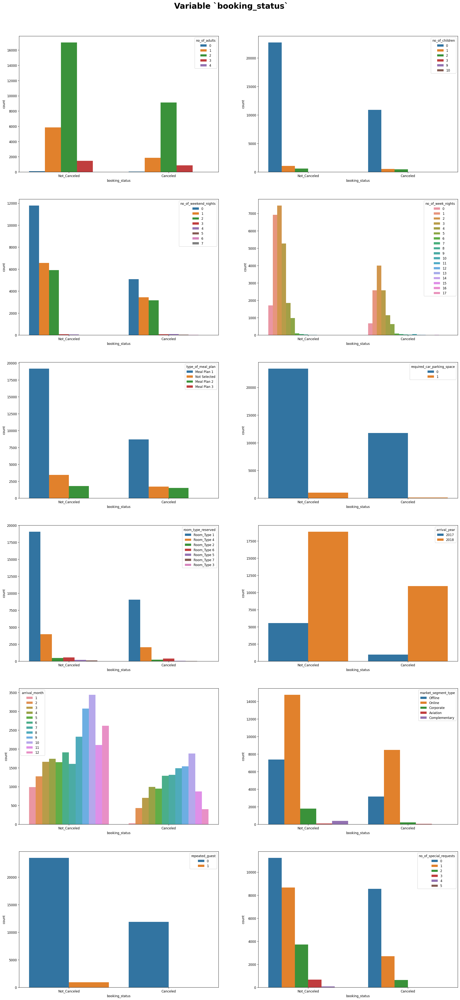

In [ ]:
col = 0
row = 0

fig, ax = plt.subplots(6, 2, figsize=(25, 50))

for column in data.drop(
    [
        "lead_time",
        "arrival_date",
        "no_of_previous_bookings_not_canceled",
        "avg_price_per_room",
        "booking_status",
        "no_of_previous_cancellations"
    ],
    axis=1
).columns:
    sns.countplot(data=data, x="booking_status", hue=column, ax=ax[row, col])

    col += 1
    if col > 1:
        row += 1
        col = 0

fig.subplots_adjust(top=0.95)
plt.suptitle("Variable `booking_status`", fontweight="bold", fontsize=25)

In [ ]:
import plotly.express as px
data1 = data.drop(labels = ['booking_status'], axis = 1)
fig = px.imshow(data1.corr(), color_continuous_scale="Blues")
fig.update_layout(height=800)
fig.show()

<Axes: >

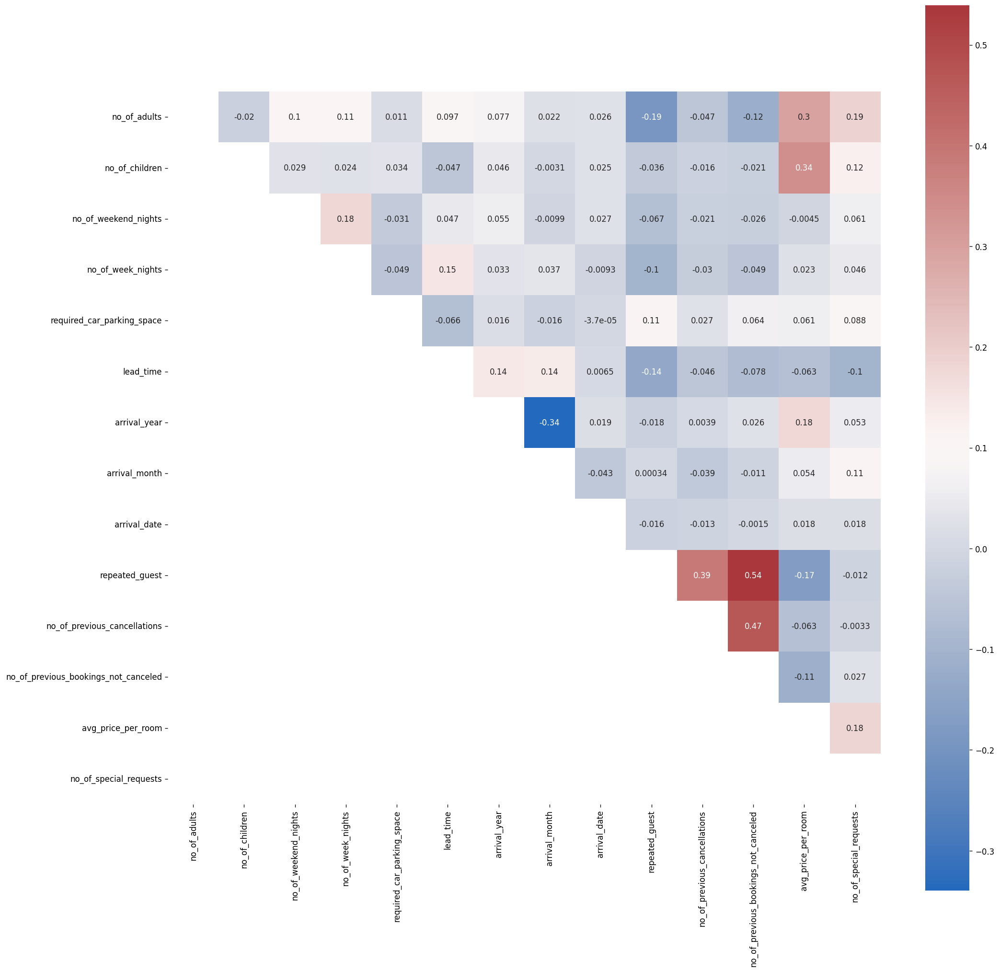

In [ ]:
fig = plt.figure(figsize=(20,20))
corr = data1.corr()
sns.heatmap(corr, mask=np.tril(corr), annot=True, cmap='vlag', square=True)

# **Encoding**

In [ ]:
data['lead_time'].value_counts()

0      1297
1      1078
2       643
3       630
4       628
       ... 
300       1
353       1
328       1
352       1
351       1
Name: lead_time, Length: 352, dtype: int64

A new encoded dataset will be created. The following keys must be encoded to numerical values:

type_of_meal_plan

room_type_reserved

market_segment_type

booking_status

In [ ]:
data['room_type_reserved'].value_counts()

Room_Type 1    28130
Room_Type 4     6057
Room_Type 6      966
Room_Type 2      692
Room_Type 5      265
Room_Type 7      158
Room_Type 3        7
Name: room_type_reserved, dtype: int64

In [ ]:
data['room_type_reserved'] = data['room_type_reserved'].replace({'Room_Type 1': 1, "Room_Type 2": 2, "Room_Type 3": 3, "Room_Type 4": 4, "Room_Type 5": 5, "Room_Type 6": 6, "Room_Type 7": 7})
data.head()


,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,Not Selected,0,1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,Meal Plan 1,0,1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,2,0,0,2,Meal Plan 1,0,1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,2,0,1,1,Not Selected,0,1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [ ]:
data['type_of_meal_plan'].value_counts()

Meal Plan 1     27835
Not Selected     5130
Meal Plan 2      3305
Meal Plan 3         5
Name: type_of_meal_plan, dtype: int64

In [ ]:
data['type_of_meal_plan'] = data['type_of_meal_plan'].replace({"Not Selected": 0, "Meal Plan 1": 1, "Meal Plan 2": 2, "Meal Plan 3": 3})
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,1,0,1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,0,0,1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,1,0,1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,2,0,0,2,1,0,1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,2,0,1,1,0,0,1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [ ]:
data['market_segment_type'].value_counts()

Online           23214
Offline          10528
Corporate         2017
Complementary      391
Aviation           125
Name: market_segment_type, dtype: int64

In [ ]:
data['market_segment_type'] = data['market_segment_type'].replace({"Online": 1, "Offline": 2, "Corporate": 3, "Complementary": 4, "Aviation": 5})
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,1,0,1,224,2017,10,2,2,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,0,0,1,5,2018,11,6,1,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,1,0,1,1,2018,2,28,1,0,0,0,60.00,0,Canceled
3,2,0,0,2,1,0,1,211,2018,5,20,1,0,0,0,100.00,0,Canceled
4,2,0,1,1,0,0,1,48,2018,4,11,1,0,0,0,94.50,0,Canceled


In [ ]:
data['booking_status'].value_counts()

Not_Canceled    24390
Canceled        11885
Name: booking_status, dtype: int64

In [ ]:
data['booking_status'] = data['booking_status'].replace({"Canceled": 0, "Not_Canceled": 1})
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,1,0,1,224,2017,10,2,2,0,0,0,65.00,0,1
1,2,0,2,3,0,0,1,5,2018,11,6,1,0,0,0,106.68,1,1
2,1,0,2,1,1,0,1,1,2018,2,28,1,0,0,0,60.00,0,0
3,2,0,0,2,1,0,1,211,2018,5,20,1,0,0,0,100.00,0,0
4,2,0,1,1,0,0,1,48,2018,4,11,1,0,0,0,94.50,0,0


# **Model**

In [ ]:
X = np.asarray(data[['no_of_adults','no_of_children','no_of_week_nights','type_of_meal_plan','required_car_parking_space','room_type_reserved','lead_time','arrival_year','arrival_month','arrival_date','market_segment_type','repeated_guest','no_of_previous_cancellations','no_of_previous_bookings_not_canceled','avg_price_per_room','no_of_special_requests']])
X

array([[  2.  ,   0.  ,   2.  , ...,   0.  ,  65.  ,   0.  ],
       [  2.  ,   0.  ,   3.  , ...,   0.  , 106.68,   1.  ],
       [  1.  ,   0.  ,   1.  , ...,   0.  ,  60.  ,   0.  ],
       ...,
       [  2.  ,   0.  ,   6.  , ...,   0.  ,  98.39,   2.  ],
       [  2.  ,   0.  ,   3.  , ...,   0.  ,  94.5 ,   0.  ],
       [  2.  ,   0.  ,   2.  , ...,   0.  , 161.67,   0.  ]])

In [ ]:
y = np.asarray(data['booking_status'])
y

array([1, 1, 0, ..., 1, 0, 1])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 0)

In [ ]:
from sklearn import preprocessing
from sklearn import metrics
X = preprocessing.StandardScaler().fit(X).transform(X)
X

array([[ 0.3 , -0.26, -0.14, ..., -0.09, -1.1 , -0.79],
       [ 0.3 , -0.26,  0.56, ..., -0.09,  0.09,  0.48],
       [-1.63, -0.26, -0.85, ..., -0.09, -1.24, -0.79],
       ...,
       [ 0.3 , -0.26,  2.69, ..., -0.09, -0.14,  1.76],
       [ 0.3 , -0.26,  0.56, ..., -0.09, -0.25, -0.79],
       [ 0.3 , -0.26, -0.14, ..., -0.09,  1.66, -0.79]])

## **Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression
import itertools
from sklearn.metrics import classification_report, confusion_matrix

lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

accuracy_lr = accuracy_score(y_test, y_pred)
f1_lr = f1_score(y_test, y_pred)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.72      0.56      0.63      3574
           1       0.81      0.89      0.85      7309

    accuracy                           0.78     10883
   macro avg       0.76      0.73      0.74     10883
weighted avg       0.78      0.78      0.77     10883



/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
print (accuracy_lr, f1_lr)

0.7827804833226133 0.8464935064935065


In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting normalize=True.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
print(confusion_matrix(y_test, y_pred, labels=[1,0]))

[[6518  791]
 [1573 2001]]


Confusion matrix, without normalization
[[6518  791]
 [1573 2001]]


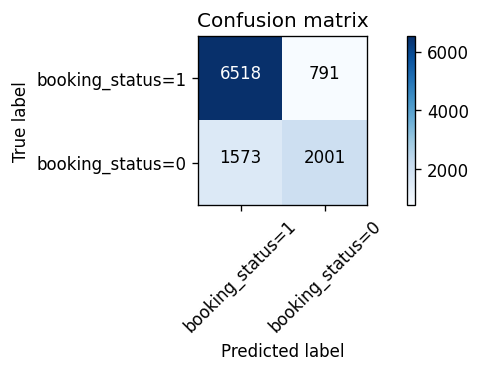

In [ ]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred, labels=[1,0])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['booking_status=1','booking_status=0'],normalize= False,  title='Confusion matrix')

## **KNN**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier #kNN classifier
from sklearn.model_selection import train_test_split #train and test sets 

In [ ]:
knn = KNeighborsClassifier()
from sklearn.model_selection import GridSearchCV
k_range = list(range(10, 31))
param_grid = dict(n_neighbors=k_range)
  
# defining parameter range
grid = GridSearchCV(knn, param_grid, cv=10, scoring='accuracy', return_train_score=False,verbose=1)
  
# fitting the model for grid search
grid_search=grid.fit(X_train, y_train)

Fitting 10 folds for each of 21 candidates, totalling 210 fits


In [ ]:
print(grid_search.best_params_)

{'n_neighbors': 11}


In [ ]:
y_predict_knn = grid_search.predict(X_test)
print(classification_report(y_test, y_predict_knn))

              precision    recall  f1-score   support

           0       0.76      0.57      0.65      3574
           1       0.81      0.91      0.86      7309

    accuracy                           0.80     10883
   macro avg       0.79      0.74      0.76     10883
weighted avg       0.80      0.80      0.79     10883



In [ ]:
accuracy = grid_search.best_score_ *100
print("Accuracy for our training dataset with tuning is : {:.2f}%".format(accuracy) )

Accuracy for our training dataset with tuning is : 80.47%


In [ ]:
knn = KNeighborsClassifier(n_neighbors=11)

knn.fit(X, y)

y_test_knn=knn.predict(X_test) 

test_accuracy=accuracy_score(y_test,y_test_knn)*100

print("Accuracy for our testing dataset with tuning is : {:.2f}%".format(test_accuracy) )

Accuracy for our testing dataset with tuning is : 83.67%


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
accuracy_knn = accuracy_score(y_test, y_predict_knn)
print(accuracy_knn)
f1_knn = f1_score(y_test, y_predict_knn)
print(f1_knn)

0.7999632454286502
0.85966608650809


## **Naive Bayes**

# New Section

In [ ]:
import pandas as pd
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.utils.multiclass import unique_labels

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [ ]:
mnb = MultinomialNB()
y_pred_nb = mnb.fit(X_train, y_train).predict(X_test)

In [ ]:
(y_test != y_pred_nb).sum()

3017

In [ ]:
print("Number of mislabeled points out of a total %d points : %d"% (X_test.shape[0], (y_test != y_pred_nb).sum()))

Number of mislabeled points out of a total 10883 points : 3017


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred_nb)

0.7227786455940458

In [ ]:
print("Accuracy of Naive Bayes is:", 100 * metrics.accuracy_score(y_test, y_pred_nb), '%')

Accuracy of Naive Bayes is: 72.27786455940458 %


## **Decision** **Tree**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
plt.rcParams.update({'figure.figsize':(7,3), 'figure.dpi':120})

In [ ]:
print(X_train.shape)
print(y_train.shape)

(25392, 16)
(25392,)


In [ ]:
print(X_test.shape)
print(y_test.shape)

(10883, 16)
(10883,)


In [ ]:
from sklearn.tree import DecisionTreeClassifier
drugTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)

In [ ]:
drugTree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4)

In [ ]:
predTree = drugTree.predict(X_test)

In [ ]:
print(predTree[0:5])
print(y_test[0:5])

[1 1 0 1 1]
[1 0 0 0 1]


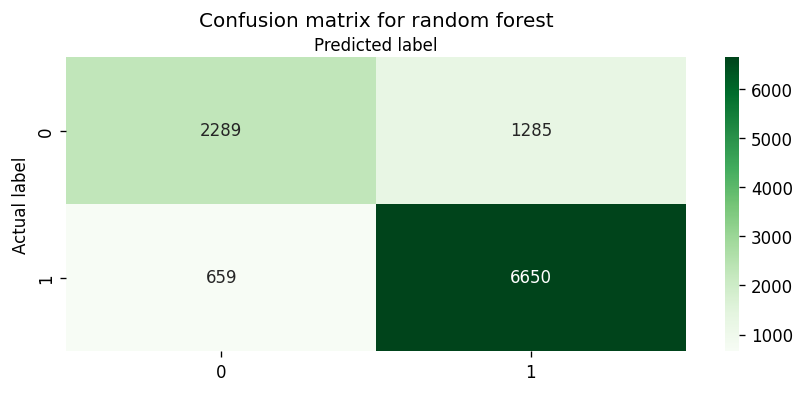

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, predTree)
class_names = [0,1]
fig,ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks,class_names)
plt.yticks(tick_marks,class_names)
sns.heatmap(pd.DataFrame(confusion_matrix), annot = True, cmap = 'Greens', fmt = 'g')
ax.xaxis.set_label_position('top')
plt.tight_layout()
plt.title('Confusion matrix for random forest')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
from  io import StringIO
import pydotplus
import matplotlib.image as mpimg
from sklearn import tree
%matplotlib inline 

In [ ]:
from sklearn import tree
from sklearn.datasets import load_iris

In [ ]:
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X,y)

[Text(0.772475844058467, 0.9871794871794872, 'lead_time <= 0.771\ngini = 0.441\nsamples = 36275\nvalue = [11885, 24390]\nclass = 1'),
 Text(0.5713536907916613, 0.9615384615384616, 'no_of_special_requests <= -0.152\ngini = 0.355\nsamples = 29127\nvalue = [6716, 22411]\nclass = 1'),
 Text(0.3112568834668083, 0.9358974358974359, 'market_segment_type <= 0.077\ngini = 0.443\nsamples = 15206\nvalue = [5031, 10175]\nclass = 1'),
 Text(0.13418251569838466, 0.9102564102564102, 'lead_time <= -0.835\ngini = 0.499\nsamples = 7468\nvalue = [3914, 3554]\nclass = 0'),
 Text(0.04922129248909827, 0.8846153846153846, 'avg_price_per_room <= 2.828\ngini = 0.362\nsamples = 2025\nvalue = [480, 1545]\nclass = 1'),
 Text(0.03954730153315694, 0.8589743589743589, 'lead_time <= -0.951\ngini = 0.345\nsamples = 1983\nvalue = [439, 1544]\nclass = 1'),
 Text(0.021084365118144356, 0.8333333333333334, 'arrival_month <= -0.627\ngini = 0.208\nsamples = 999\nvalue = [118, 881]\nclass = 1'),
 Text(0.009592602494721995, 0.

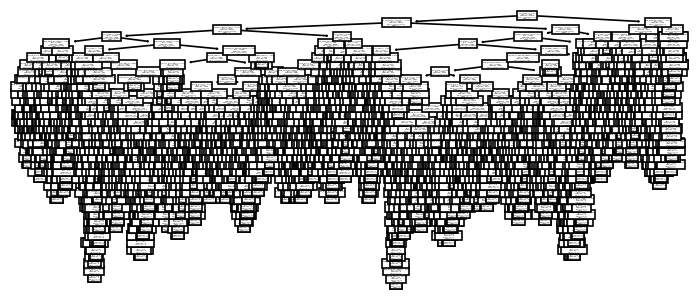

In [ ]:
tree.plot_tree(clf,feature_names=['no_of_adults','no_of_children','no_of_week_nights','type_of_meal_plan','required_car_parking_space','room_type_reserved','lead_time','arrival_year','arrival_month','arrival_date','market_segment_type','repeated_guest','no_of_previous_cancellations','no_of_previous_bookings_not_canceled','avg_price_per_room','no_of_special_requests'], class_names=['0','1','2','3'])

In [ ]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

In [ ]:
decision_tree = DecisionTreeClassifier(random_state=0, max_depth=4)
decision_tree = decision_tree.fit(X, y)
r = export_text(decision_tree, feature_names=['no_of_adults','no_of_children','no_of_week_nights','type_of_meal_plan','required_car_parking_space','room_type_reserved','lead_time','arrival_year','arrival_month','arrival_date','market_segment_type','repeated_guest','no_of_previous_cancellations','no_of_previous_bookings_not_canceled','avg_price_per_room','no_of_special_requests'])
print(r)

|--- lead_time <= 0.77
|   |--- no_of_special_requests <= -0.15
|   |   |--- market_segment_type <= 0.08
|   |   |   |--- lead_time <= -0.83
|   |   |   |   |--- class: 1
|   |   |   |--- lead_time >  -0.83
|   |   |   |   |--- class: 0
|   |   |--- market_segment_type >  0.08
|   |   |   |--- lead_time <= 0.06
|   |   |   |   |--- class: 1
|   |   |   |--- lead_time >  0.06
|   |   |   |   |--- class: 1
|   |--- no_of_special_requests >  -0.15
|   |   |--- no_of_special_requests <= 1.12
|   |   |   |--- market_segment_type <= 0.08
|   |   |   |   |--- class: 1
|   |   |   |--- market_segment_type >  0.08
|   |   |   |   |--- class: 1
|   |   |--- no_of_special_requests >  1.12
|   |   |   |--- lead_time <= 0.06
|   |   |   |   |--- class: 1
|   |   |   |--- lead_time >  0.06
|   |   |   |   |--- class: 1
|--- lead_time >  0.77
|   |--- avg_price_per_room <= -0.10
|   |   |--- no_of_special_requests <= -0.15
|   |   |   |--- market_segment_type <= 0.08
|   |   |   |   |--- class: 0
|  

In [ ]:
import graphviz

In [ ]:
dot_data = tree.export_graphviz(clf, out_file=None) 
graph = graphviz.Source(dot_data) 
graph.render("booking_status")

'booking_status.pdf'

In [ ]:
dot_data = tree.export_graphviz(clf, out_file=None,feature_names=['no_of_adults','no_of_children','no_of_week_nights','type_of_meal_plan','required_car_parking_space','room_type_reserved','lead_time','arrival_year','arrival_month','arrival_date','market_segment_type','repeated_guest','no_of_previous_cancellations','no_of_previous_bookings_not_canceled','avg_price_per_room','no_of_special_requests'],class_names=['0','1','2','3','4','5','6','7','8'],filled=True, rounded=True, special_characters=True)  
graph = graphviz.Source(dot_data) 

In [ ]:
graph

In [ ]:
loanTree = DecisionTreeClassifier(criterion="entropy")
loanTree.fit(X_train, y_train)
predTree = loanTree.predict(X_test)

In [ ]:
print(classification_report(y_test, predTree))

              precision    recall  f1-score   support

           0       0.81      0.80      0.81      3574
           1       0.90      0.91      0.90      7309

    accuracy                           0.87     10883
   macro avg       0.86      0.86      0.86     10883
weighted avg       0.87      0.87      0.87     10883



In [ ]:
y_pred_dt = predTree


In [ ]:
f1_dt = f1_score(y_test, predTree)
print(f1_dt)

0.9048628684768484


In [ ]:
accuracy_score(y_test, y_pred_dt)

0.87218597813103

In [ ]:
accuracy_dt=accuracy_score(y_test, y_pred_dt)
print(accuracy_dt)

0.87218597813103


In [ ]:
print("Accuracy of Decision Tree is:", 100 * accuracy_score(y_test, y_pred_dt), '%')

Accuracy of Decision Tree is: 87.218597813103 %


## **Random Forest**

In [ ]:
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score,recall_score


In [ ]:

X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.3, random_state=0)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

accuracy_rf = accuracy_score(y_test, y_pred)
f1_rf = f1_score(y_test, y_pred)

print(accuracy_rf, f1_rf)

0.8848501555546804 0.9162993072651286


In [ ]:
# Print the Confusion Matrix and slice it into four pieces
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[ 6464  1845]
 [ 1079 16005]]

True Positives(TP) =  6464

True Negatives(TN) =  16005

False Positives(FP) =  1845

False Negatives(FN) =  1079


Text(0.5, 3.266666666666663, 'Predicted label')

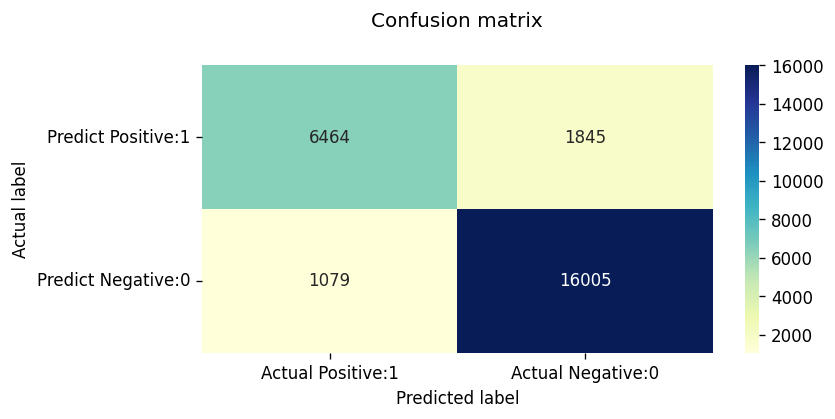

In [ ]:
# visualize confusion matrix with seaborn heatmap
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.78      0.82      8309
           1       0.90      0.94      0.92     17084

    accuracy                           0.88     25393
   macro avg       0.88      0.86      0.87     25393
weighted avg       0.88      0.88      0.88     25393



## **SVC**

In [ ]:
data.shape

(36275, 18)

In [ ]:
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,1,0,1,224,2017,10,2,2,0,0,0,65.00,0,1
1,2,0,2,3,0,0,1,5,2018,11,6,1,0,0,0,106.68,1,1
2,1,0,2,1,1,0,1,1,2018,2,28,1,0,0,0,60.00,0,0
3,2,0,0,2,1,0,1,211,2018,5,20,1,0,0,0,100.00,0,0
4,2,0,1,1,0,0,1,48,2018,4,11,1,0,0,0,94.50,0,0


In [ ]:
X = data.drop(['booking_status'], axis=1)
y = data['booking_status']

In [ ]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [ ]:
# check the shape of X_train and X_test
X_train.shape, X_test.shape

((25392, 17), (10883, 17))

In [ ]:
# Feature Scaling
cols = X_train.columns

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
X_train = pd.DataFrame(X_train, columns=[cols])

In [ ]:
X_test = pd.DataFrame(X_test, columns=[cols])

In [ ]:
X_train.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04,2.539200e+04
mean,-2.062342e-16,1.762925e-17,8.419366e-17,1.533465e-16,-2.238635e-18,1.483096e-17,6.981743e-17,-9.234369e-18,2.351496e-13,1.131910e-16,-5.960366e-17,5.106886e-17,5.638562e-17,9.234369e-18,-3.581816e-17,4.687142e-18,-4.645168e-17
std,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00,1.000020e+00
min,-3.569317e+00,-2.603846e-01,-9.283797e-01,-1.566108e+00,-1.973371e+00,-1.762483e-01,-5.054134e-01,-9.911043e-01,-2.122086e+00,-2.092915e+00,-1.676474e+00,-6.606655e-01,-1.668824e-01,-6.622970e-02,-9.228168e-02,-2.952751e+00,-7.831155e-01
25%,3.050085e-01,-2.603846e-01,-9.283797e-01,-8.528184e-01,9.994235e-02,-1.762483e-01,-5.054134e-01,-7.932126e-01,4.712343e-01,-7.910212e-01,-8.743723e-01,-6.606655e-01,-1.668824e-01,-6.622970e-02,-9.228168e-02,-6.553755e-01,-7.831155e-01
50%,3.050085e-01,-2.603846e-01,2.212066e-01,-1.395286e-01,9.994235e-02,-1.762483e-01,-5.054134e-01,-3.275851e-01,4.712343e-01,1.853988e-01,4.231540e-02,-6.606655e-01,-1.668824e-01,-6.622970e-02,-9.228168e-02,-1.074956e-01,-7.831155e-01
75%,3.050085e-01,-2.603846e-01,1.370793e+00,5.737612e-01,9.994235e-02,-1.762483e-01,-5.054134e-01,4.639817e-01,4.712343e-01,8.363455e-01,8.444172e-01,8.035589e-01,-1.668824e-01,-6.622970e-02,-9.228168e-02,4.804381e-01,4.901680e-01
max,4.179334e+00,2.212681e+01,7.118724e+00,1.055982e+01,4.246570e+00,5.673813e+00,3.771455e+00,4.165721e+00,4.712343e-01,1.487292e+00,1.761105e+00,5.196232e+00,5.992243e+00,3.356786e+01,3.161713e+01,1.249660e+01,5.583302e+00



```



In [ ]:
# import SVC classifier
from sklearn.svm import SVC

# import metrics to compute accuracy
from sklearn.metrics import accuracy_score

# instantiate classifier with default hyperparameters
svc=SVC() 

# fit classifier to training set
svc.fit(X_train,y_train)

# make predictions on test set
y_pred=svc.predict(X_test)

# compute and print accuracy score
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with default hyperparameters: 0.8429


In [ ]:
# instantiate classifier with linear kernel and C=1.0
linear_svc=SVC(kernel='linear', C=1.0) 

# fit classifier to training set
linear_svc.fit(X_train,y_train)

# make predictions on test set
y_pred_test=linear_svc.predict(X_test)

# compute and print accuracy score
print('Model accuracy score with linear kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred_test)))

Model accuracy score with linear kernel and C=1.0 : 0.8021


In [ ]:
y_pred_train = linear_svc.predict(X_train)

y_pred_train

array([1, 0, 1, ..., 0, 1, 1])

In [ ]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.8044


In [ ]:
# print the scores on training and test set
print('Training set score: {:.4f}'.format(linear_svc.score(X_train, y_train)))
print('Test set score: {:.4f}'.format(linear_svc.score(X_test, y_test)))

Training set score: 0.8044
Test set score: 0.8021


In [ ]:
# check class distribution in test set
y_test.value_counts()

1    7309
0    3574
Name: booking_status, dtype: int64

In [ ]:
# check null accuracy score
null_accuracy = (3306/(3306+274))
print('Null accuracy score: {0:0.4f}'. format(null_accuracy))

Null accuracy score: 0.9235


In [ ]:
# instantiate classifier with polynomial kernel and C=1.0
poly_svc=SVC(kernel='poly', C=1.0) 

# fit classifier to training set
poly_svc.fit(X_train,y_train)

# make predictions on test set
y_pred=poly_svc.predict(X_test)

# compute and print accuracy score
print('Model accuracy score with polynomial kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))


Model accuracy score with polynomial kernel and C=1.0 : 0.8285


In [ ]:
# instantiate classifier with sigmoid kernel and C=1.0
sigmoid_svc=SVC(kernel='sigmoid', C=1.0) 

# fit classifier to training set
sigmoid_svc.fit(X_train,y_train)

# make predictions on test set
y_pred=sigmoid_svc.predict(X_test)

# compute and print accuracy score
print('Model accuracy score with sigmoid kernel and C=1.0 : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))


Model accuracy score with sigmoid kernel and C=1.0 : 0.6971


In [ ]:
# Print the Confusion Matrix and slice it into four pieces
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_test)
print('Confusion matrix\n\n', cm)
print('\nTrue Positives(TP) = ', cm[0,0])
print('\nTrue Negatives(TN) = ', cm[1,1])
print('\nFalse Positives(FP) = ', cm[0,1])
print('\nFalse Negatives(FN) = ', cm[1,0])

Confusion matrix

 [[2134 1440]
 [ 714 6595]]

True Positives(TP) =  2134

True Negatives(TN) =  6595

False Positives(FP) =  1440

False Negatives(FN) =  714


<Axes: >

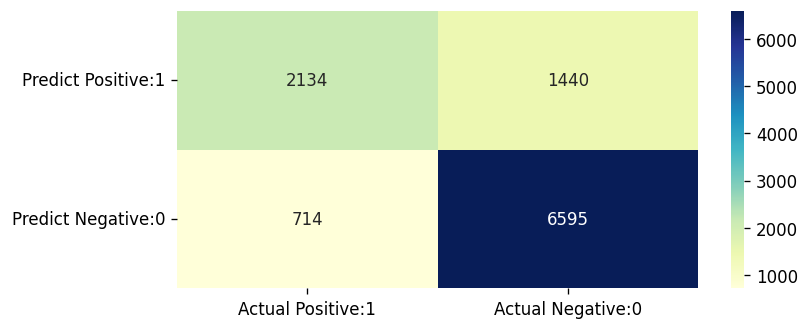

In [ ]:
# visualize confusion matrix with seaborn heatmap
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.75      0.60      0.66      3574
           1       0.82      0.90      0.86      7309

    accuracy                           0.80     10883
   macro avg       0.79      0.75      0.76     10883
weighted avg       0.80      0.80      0.80     10883



In [ ]:
TP = cm[1,1]
TN = cm[0,1]
FP = cm[1,0]
FN = cm[0,1]

In [ ]:
# print classification accuracy
classification_accuracy = (TP + TN) / float(TP + TN + FP + FN)
print('Classification accuracy : {0:0.4f}'.format(classification_accuracy))

Classification accuracy : 0.7886


In [ ]:
# print classification error
classification_error = (FP + FN) / float(TP + TN + FP + FN)
print('Classification error : {0:0.4f}'.format(classification_error))

Classification error : 0.2114


In [ ]:
# print precision score
precision = TP / float(TP + FP)
print('Precision : {0:0.4f}'.format(precision))

Precision : 0.9023


In [ ]:
recall = TP / float(TP + FN)
print('Recall or Sensitivity : {0:0.4f}'.format(recall))

Recall or Sensitivity : 0.8208


In [ ]:
true_positive_rate = TP / float(TP + FN)
print('True Positive Rate : {0:0.4f}'.format(true_positive_rate))

True Positive Rate : 0.8208


In [ ]:
false_positive_rate = FP / float(FP + TN)
print('False Positive Rate : {0:0.4f}'.format(false_positive_rate))

False Positive Rate : 0.3315


In [ ]:
specificity = TN / (TN + FP)
print('Specificity : {0:0.4f}'.format(specificity))

Specificity : 0.6685


In [ ]:
accuracy_svc = accuracy_score(y_test, y_pred_test)
print(accuracy_svc)
f1_svc = f1_score(y_test, y_pred_test).round(13)
print(f1_svc)

0.8020766332812643
0.8596193952033


# **Boosting**

## **Gradient Boosting**

In [ ]:
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score,recall_score


In [ ]:
label=data['booking_status']
features=data.drop(['booking_status'],axis=1)
features_t,features_v,label_t,label_v=train_test_split(features,label,train_size=0.7)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gbt = GradientBoostingClassifier()
gbt.fit(features_t, label_t)
y_pred = gbt.predict(features_v)

accuracy_gbt = accuracy_score(label_v, y_pred)
f1_gbt = f1_score(label_v, y_pred)

print(accuracy_gbt, f1_gbt)

0.8482955067536525 0.8905970445961169


## **XGBClassifier**

In [ ]:
import xgboost as xgb

xgb = xgb.XGBClassifier()
xgb.fit(features_t, label_t)
y_pred = xgb.predict(features_v)

accuracy_xgb = accuracy_score(label_v, y_pred)
f1_xgb = f1_score(label_v, y_pred)

print(accuracy_xgb, f1_xgb)


0.8903794909491868 0.9196687091778332


## **SGDClassifier**

In [ ]:
from sklearn.linear_model import SGDClassifier

sgd = SGDClassifier()
sgd.fit(features_t, label_t)
y_pred = sgd.predict(features_v)

accuracy_sgd = accuracy_score(label_v, y_pred)
f1_sgd = f1_score(label_v, y_pred)

print(accuracy_sgd, f1_sgd)

0.7428098869796931 0.8347209920283437


# **Conclusion**

In [ ]:
models = pd.DataFrame({
    'Model': ['Random Forest', 
              'KNN', 
              'Decision Tree', 
              'Logistic Regression', 
              'SVC',
              'SGD',
              'XGB',
              'GradientBoosting'
                ],
    'F1_Score': [f1_rf,
                 f1_knn,
                 f1_dt,
                 f1_lr,
                 f1_svc,
                 f1_sgd,
                 f1_xgb,
                 f1_gbt
              ],
      'Accuracy':[accuracy_rf,
                 accuracy_knn,
                 accuracy_dt,
                 accuracy_lr,
                 accuracy_svc,
                 accuracy_sgd,
                 accuracy_sgd,
                 accuracy_gbt]})
models.sort_values(by='Accuracy', ascending=False)

,Model,F1_Score,Accuracy
0,Random Forest,0.916299,0.884850
2,Decision Tree,0.904863,0.872186
7,GradientBoosting,0.890597,0.848296
4,SVC,0.859619,0.802077
1,KNN,0.859666,0.799963
3,Logistic Regression,0.846494,0.782780
5,SGD,0.834721,0.742810
6,XGB,0.919669,0.742810
